# Topology selection

Reconstructs the interaction topology of each event — absorption, charge
exchange, single pion production, or pion production — from per-PFO tags, and
compares selectors:

1. **Cut-based**: the thesis cuts, for π±, γ and π⁰.
2. **Hybrid π±**: the ML pion tagger at three operating points (efficiency-matched,
   purity-matched, and its own optimum), with cut-based photons.
3. **Hybrid π± + hybrid γ**: ML on both sides, with the π⁰ pairing relaxed.

The π⁰ step is the bottleneck: it needs *two* photons, so photon efficiency
enters squared, and requiring exactly two tagged photons discards events with a
spare shower. Both effects are quantified below before the topology matrices.

## Setup


In [1]:
import pickle

import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import csv

from utils.general_utils import (PROJECT_ROOT, SELECTION_CUTS, SPECIES_COLORS,
                                 species_label, target_config,
                                 purity, efficiency)

from utils.evaluation_utils import cut_table

from utils.topology_utils import (Pi0Reconstructor, classify_topology,
                                  best_row, print_scan, save_scan,
                                  TRUE_ORDER, RECO_ORDER,
                                  MASS_CUT, PHI_CUT)

from utils.topology_plots import plot_topology_grid, plot_topology_single, plot_pi0_scan, plot_table

# Both targets are needed at once here: classify_topology takes pion, photon
# and pi0 counts together, so this notebook has no single TARGET switch.
PION_CFG   = target_config("pion")
PHOTON_CFG = target_config("photon")

PREPARED_DIR = PROJECT_ROOT / "prepared" / "prepared-mc"
PRED_MC_DIR  = PROJECT_ROOT / "predictions" / "predictions-mc"
TOPO_DIR     = PROJECT_ROOT / "predictions" / "topology-results"
PLOTS_DIR   = PROJECT_ROOT / "plots" / "topology-selection"
for d in (TOPO_DIR, PLOTS_DIR):
    d.mkdir(parents=True, exist_ok=True)

PION_PRED   = f"hybrid_cnn_mlp{PION_CFG['suffix']}.pkl"
PHOTON_PRED = f"hybrid_cnn_mlp{PHOTON_CFG['suffix']}.pkl"

print(f"pion model   : {PION_PRED}")
print(f"photon model : {PHOTON_PRED}")

pion model   : hybrid_cnn_mlp_pion.pkl
photon model : hybrid_cnn_mlp_photon.pkl


## Load predictions and test PFOs

In [2]:
with open(PREPARED_DIR / "test_tracks.pkl", "rb") as f:
    test_pfos = pickle.load(f)

with open(PRED_MC_DIR / PION_PRED, "rb") as f:
    pion_results = pickle.load(f)
    print(f"using: {pion_results['model_name']}")

with open(PRED_MC_DIR / PHOTON_PRED, "rb") as f:
    photon_results = pickle.load(f)
    print(f"using: {photon_results['model_name']}")

pion_probs,   PION_THRESHOLD   = pion_results['probs'],   pion_results['threshold']
photon_probs, PHOTON_THRESHOLD = photon_results['probs'], photon_results['threshold']

species = np.array([species_label(p) for p in test_pfos])

# Every array below is indexed the same way as test_pfos; if that ever stops
# being true the whole notebook is silently wrong, so check it once here.
assert len(pion_probs) == len(test_pfos), "pion predictions misaligned with test PFOs"
assert len(photon_probs) == len(test_pfos), "photon predictions misaligned with test PFOs"

print(f"{len(test_pfos):,} test PFOs")
print(f"pion   hybrid: t={PION_THRESHOLD:.3f}, purity {100*pion_results['purity']:.1f}%, "
      f"efficiency {100*pion_results['efficiency']:.1f}%")
print(f"photon hybrid: t={PHOTON_THRESHOLD:.3f}, purity {100*photon_results['purity']:.1f}%, "
      f"efficiency {100*photon_results['efficiency']:.1f}%")

using: hybrid all8 -- pion target
using: hybrid all8 -- photon target
126,817 test PFOs
pion   hybrid: t=0.550, purity 62.9%, efficiency 78.1%
photon hybrid: t=0.570, purity 60.8%, efficiency 83.9%


## Cut-based selection

The thesis cut flow for π± and γ. The final row of each is the benchmark the
ML selectors are matched against below.

In [3]:
cut_rows_pion   = cut_table(test_pfos, SELECTION_CUTS["pion"],
                            PION_CFG['is_signal'],   label='pi+')
cut_rows_photon = cut_table(test_pfos, SELECTION_CUTS["photon"],
                            PHOTON_CFG['is_signal'], label='gamma')

# Per-PFO cut masks, reused throughout.
cut_pion_mask   = np.array([all(fn(p) for _, fn in SELECTION_CUTS["pion"])   for p in test_pfos])
cut_photon_mask = np.array([all(fn(p) for _, fn in SELECTION_CUTS["photon"]) for p in test_pfos])

# Truth masks, from the single shared definition rather than a local lambda.
true_pion_mask   = np.array([PION_CFG['is_signal'](p)   for p in test_pfos])
true_photon_mask = np.array([PHOTON_CFG['is_signal'](p) for p in test_pfos])

PION_CUT_PURITY     = cut_rows_pion[-1]['purity']     / 100
PION_CUT_EFFICIENCY = cut_rows_pion[-1]['efficiency'] / 100
print(f"\npi+ cut benchmark: purity {100*PION_CUT_PURITY:.1f}%, "
      f"efficiency {100*PION_CUT_EFFICIENCY:.1f}%")


  pi+ cuts
  Cut added                              Purity        Efficiency    Selected
  ------------------------------------------------------------------------------
  (no cuts)                    17.6 ± 0.1%    100.0 ± 0.0%     126,817
  chi²/ndof_p > 61.2           23.1 ± 0.1%    94.4 ± 0.2%      91,397
  track length > 27.1          30.1 ± 0.2%    64.8 ± 0.3%      48,181
  track score > 0.5            39.2 ± 0.3%    61.6 ± 0.3%      35,108
  1.6 < dEdX median < 2.8      41.3 ± 0.3%    53.8 ± 0.3%      29,127
  ------------------------------------------------------------------------------
  Purity × Efficiency = 41.3% × 53.8% = 22.20%

  gamma cuts
  Cut added                              Purity        Efficiency    Selected
  ------------------------------------------------------------------------------
  (no cuts)                    15.6 ± 0.1%    100.0 ± 0.0%     126,817
  chi²/ndof_p > 61.2           20.6 ± 0.1%    95.2 ± 0.2%      91,397
  track score < 0.45           44.0 

### Which species the π± cuts pick up by mistake

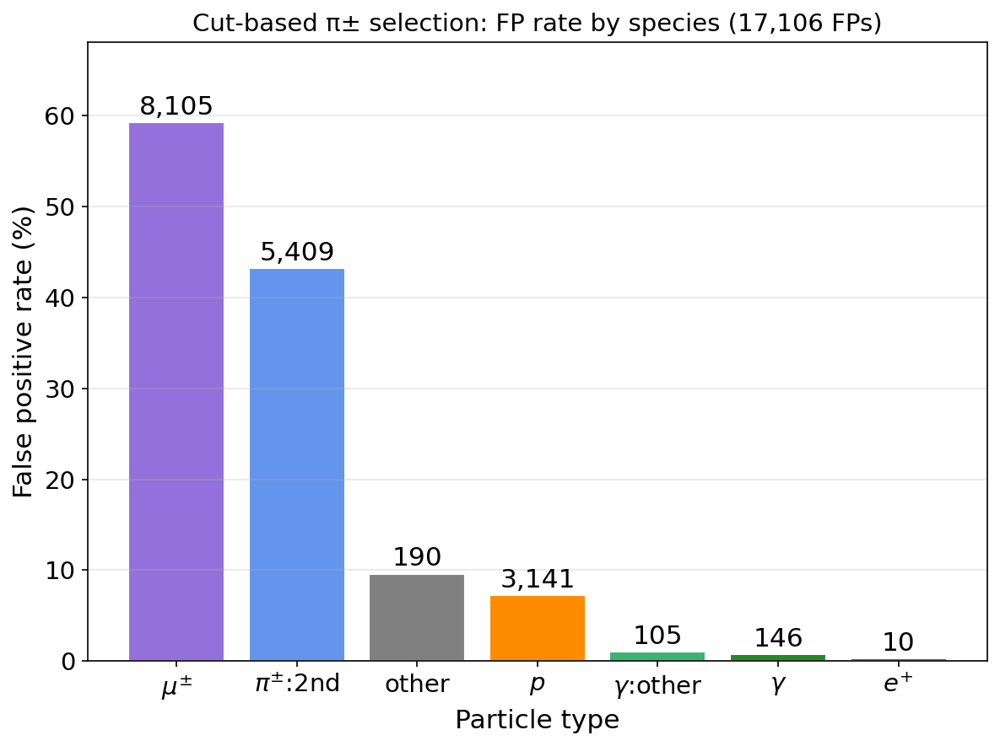

In [4]:
fp_mask = cut_pion_mask & ~true_pion_mask
fp_counts    = Counter(species[i] for i in np.where(fp_mask)[0])
total_counts = Counter(species[i] for i in np.where(~true_pion_mask)[0])

classes = sorted(total_counts, key=lambda c: -fp_counts.get(c, 0) / total_counts[c])
rates   = [100 * fp_counts.get(c, 0) / total_counts[c] for c in classes]

fig, ax = plt.subplots(figsize=(8, 6), dpi=150)
bars = ax.bar(range(len(classes)), rates,
              color=[SPECIES_COLORS.get(c, 'grey') for c in classes], edgecolor='white')
ax.set_xticks(range(len(classes)))
ax.set_xticklabels(classes, fontsize=15)
ax.set_xlabel('Particle type', fontsize=15)
ax.set_ylabel('False positive rate (%)', fontsize=15)
ax.set_title(f'Cut-based π± selection: FP rate by species ({fp_mask.sum():,} FPs)', fontsize=14)
ax.tick_params(labelsize=14)
ax.grid(True, axis='y', alpha=0.3)
ax.set_ylim(0, max(rates) * 1.15)
for bar, c in zip(bars, classes):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3,
            f'{fp_counts.get(c, 0):,}', ha='center', va='bottom', fontsize=15)
plt.tight_layout()
plt.savefig(PLOTS_DIR / "cut_pion_fp_by_species.pdf", bbox_inches='tight')
plt.show()

## π± classifier operating points

Three thresholds: matched to the cut-based efficiency, matched to the
cut-based purity, and the classifier's own purity×efficiency optimum. Both
targets are read from the cut flow above rather than hardcoded.

In [5]:
def thresh_matching(probs, truth, target, metric, n=5000):
    """Threshold whose `metric` ('purity' or 'efficiency') is closest to target."""
    best_t, best_d = 0.5, float('inf')
    for t in np.linspace(0.01, 0.99, n):
        preds = probs >= t
        TP = int((preds & truth).sum())
        denom = int(preds.sum()) if metric == 'purity' else int(truth.sum())
        val = TP / denom if denom else 0.0
        if abs(val - target) < best_d:
            best_d, best_t = abs(val - target), t
    return best_t


def report(mask, truth, name, t=None):
    TP = int((mask & truth).sum()); FP = int((mask & ~truth).sum())
    FN = int((~mask & truth).sum())
    pur, eff = TP / (TP + FP), TP / (TP + FN)
    tt = "" if t is None else f"  (t={t:.3f})"
    print(f"{name:<28} purity {100*pur:5.1f}%   efficiency {100*eff:5.1f}%{tt}")
    return pur, eff


threshold_eff = thresh_matching(pion_probs, true_pion_mask, PION_CUT_EFFICIENCY, 'efficiency')
threshold_pur = thresh_matching(pion_probs, true_pion_mask, PION_CUT_PURITY,     'purity')

preds_opt = pion_probs >= PION_THRESHOLD
preds_eff = pion_probs >= threshold_eff
preds_pur = pion_probs >= threshold_pur

pur_cut, eff_cut = report(cut_pion_mask, true_pion_mask, 'Cut-based')
pur_eff, eff_eff = report(preds_eff, true_pion_mask, 'Hybrid, efficiency-matched', threshold_eff)
pur_pur, eff_pur = report(preds_pur, true_pion_mask, 'Hybrid, purity-matched',     threshold_pur)
pur_opt, eff_opt = report(preds_opt, true_pion_mask, 'Hybrid, own optimum',        PION_THRESHOLD)

Cut-based                    purity  41.3%   efficiency  53.8%
Hybrid, efficiency-matched   purity  75.5%   efficiency  53.8%  (t=0.654)
Hybrid, purity-matched       purity  41.3%   efficiency  95.9%  (t=0.403)
Hybrid, own optimum          purity  62.9%   efficiency  78.1%  (t=0.550)


## π⁰ reconstruction

A π⁰ is built from two photon showers passing an invariant-mass and
opening-angle cut. Two pairing rules are compared:

- **exact**: require exactly two tagged photons (the thesis requirement)
- **best**: allow two or more and take the pair closest to the π⁰ mass

Note that "best" biases the reconstructed mass spectrum toward 135 MeV. That is
fine for *counting* π⁰ but the selected-pair mass must not then be fitted.

In [6]:
rec = Pi0Reconstructor(test_pfos, mass_cut=MASS_CUT, phi_cut=PHI_CUT)
print(f"{rec.n_ev:,} events, {rec.n_true_pi0:,} with a true pi0")

# Cut-based baselines, computed through the same code path as the ML scans so
# any difference is the photon selection and nothing else.
cut_pi0 = {p: rec.metrics(cut_photon_mask, pairing=p) for p in ("exact", "best")}
for p, m in cut_pi0.items():
    print(f"cut-based photons, {p:<6} pairing: purity {m['purity']:.1f}%  "
          f"efficiency {m['efficiency']:.2f}%  P×E {m['pxe']:.2f}%  "
          f"(events with ≥3 tagged γ: {m['ev_ge3']:,})")

38,082 events, 10,703 with a true pi0
cut-based photons, exact  pairing: purity 70.9%  efficiency 6.44%  P×E 4.57%  (events with ≥3 tagged γ: 421)
cut-based photons, best   pairing: purity 68.7%  efficiency 8.25%  P×E 5.66%  (events with ≥3 tagged γ: 421)


### π⁰ yield against the photon classifier threshold

Scanned for both pairing rules in one pass. The threshold that maximises π⁰
purity×efficiency is not the same as the PFO-level optimum the classifier was
tuned for, because pairing weights efficiency quadratically.

In [7]:
THRESHOLDS = np.linspace(0.05, 0.95, 37)

SCAN_META = {
    "photon_predictions":   PHOTON_PRED,
    "pfo_level_threshold":  f"{PHOTON_THRESHOLD:.4f}",
    "pfo_level_purity":     f"{100*photon_results['purity']:.2f}",
    "pfo_level_efficiency": f"{100*photon_results['efficiency']:.2f}",
    "mass_cut_MeV":         f"{MASS_CUT:g}",
    "phi_cut_deg":          f"{PHI_CUT:g}",
    "n_true_pi0":           rec.n_true_pi0,
    "n_events":             rec.n_ev,
    "n_pfos":               len(test_pfos),
}

scans = {}
for pairing in ("exact", "best"):
    scans[pairing] = rec.scan(photon_probs, THRESHOLDS, pairing=pairing)
    path = save_scan(scans[pairing], pairing, SCAN_META, PLOTS_DIR,
                     baseline=cut_pi0[pairing])
    print_scan(scans[pairing], pairing, baseline=cut_pi0[pairing])
    print(f"Saved {path}\n")

pairing = exact
   thr      TP      FP    purity      eff    P x E    ev==2    ev>=3
--------------------------------------------------------------------
  0.05     136   1,272      9.7%    1.29%    0.12%    8,744   23,424
  0.07     181   1,264     12.5%    1.72%    0.22%    9,423   20,259
  0.10     221   1,190     15.7%    2.10%    0.33%    9,695   17,762
  0.12     279   1,131     19.8%    2.65%    0.52%    9,955   15,394
  0.15     340   1,043     24.6%    3.23%    0.79%    9,970   13,341
  0.17     386     970     28.5%    3.67%    1.04%    9,764   11,784
  0.20     441     857     34.0%    4.19%    1.42%    9,360   10,543
  0.22     484     775     38.4%    4.60%    1.77%    9,102    9,478
  0.25     530     704     42.9%    5.03%    2.16%    8,743    8,698
  0.27     564     649     46.5%    5.35%    2.49%    8,414    8,025
  0.30     601     598     50.1%    5.70%    2.86%    8,141    7,421
  0.32     635     558     53.2%    6.01%    3.20%    7,801    6,923
  0.35     673    

### Comparison: photon selection × pairing rule


photon selection  pairing      purity      eff    P x E    thr
--------------------------------------------------------------
Cut-based         exact         70.9%    6.44%    4.57%     --
ML (hybrid)       exact         71.7%    9.16%    6.57%   0.62
Cut-based         best          68.7%    8.25%    5.66%     --
ML (hybrid)       best          59.7%   17.54%   10.48%   0.53

best vs current pipeline: P×E 4.57% → 10.48% (2.30×),  efficiency 6.44% → 17.54% (2.72×)
Saved /home/pemb7173/PDSP-pion-classification/plots/topology-selection/pi0_comparison.csv


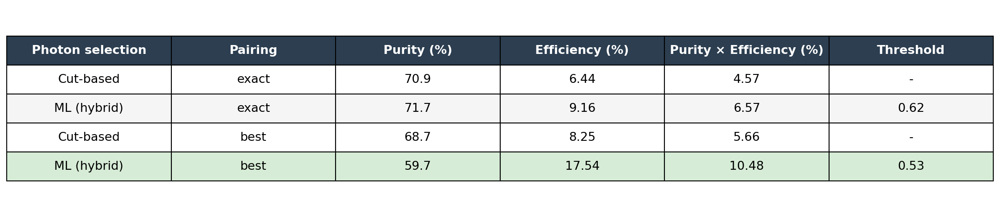

Saved /home/pemb7173/PDSP-pion-classification/plots/topology-selection/pi0_comparison_table.pdf


In [8]:
table_rows, best_by_pairing = [], {}
for pairing in ("exact", "best"):
    b = best_row(scans[pairing])
    best_by_pairing[pairing] = b
    c = cut_pi0[pairing]
    table_rows.append(["Cut-based",   pairing, c['purity'], c['efficiency'], c['pxe'], None])
    table_rows.append(["ML (hybrid)", pairing, b['purity'], b['efficiency'], b['pxe'], b['threshold']])

print(f"{'photon selection':<18}{'pairing':<10}{'purity':>9}{'eff':>9}{'P x E':>9}{'thr':>7}")
print("-" * 62)
for sel, pairing, pur, eff, pxe, t in table_rows:
    print(f"{sel:<18}{pairing:<10}{pur:>8.1f}%{eff:>8.2f}%{pxe:>8.2f}%"
          f"{('--' if t is None else f'{t:.2f}'):>7}")

base, best = table_rows[0], table_rows[-1]
print(f"\nbest vs current pipeline: P×E {base[4]:.2f}% → {best[4]:.2f}% ({best[4]/base[4]:.2f}×),"
      f"  efficiency {base[3]:.2f}% → {best[3]:.2f}% ({best[3]/base[3]:.2f}×)")

cmp_path = PLOTS_DIR / "pi0_comparison.csv"
with open(cmp_path, "w", newline="") as f:
    wr = csv.writer(f)
    for k, v in SCAN_META.items():
        wr.writerow([f"# {k}", v])
    wr.writerow(["photon_selection", "pairing", "purity", "efficiency", "pxe", "threshold"])
    for sel, pairing, pur, eff, pxe, t in table_rows:
        wr.writerow([sel, pairing, f"{pur:.2f}", f"{eff:.2f}", f"{pxe:.2f}",
                     "" if t is None else f"{t:.2f}"])
print(f"Saved {cmp_path}")

plot_table(
    [[sel, pairing, f"{pur:.1f}", f"{eff:.2f}", f"{pxe:.2f}",
      "-" if t is None else f"{t:.2f}"] for sel, pairing, pur, eff, pxe, t in table_rows],
    ['Photon selection', 'Pairing', 'Purity (%)', 'Efficiency (%)',
     'Purity × Efficiency (%)', 'Threshold'],
    PLOTS_DIR / "pi0_comparison_table.pdf",
    highlight=len(table_rows) - 1,
    figsize=(15, None),
)

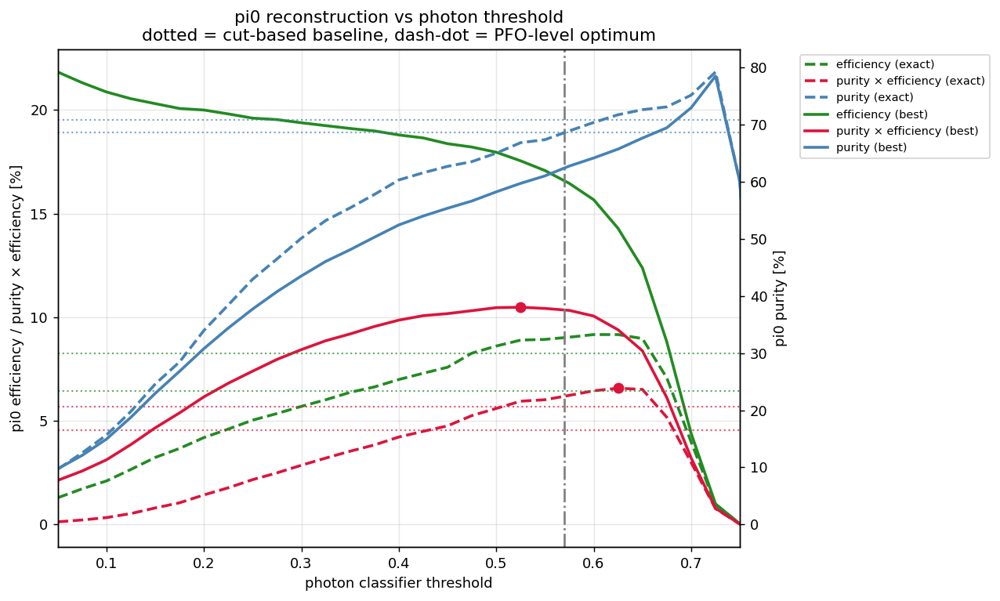

Saved /home/pemb7173/PDSP-pion-classification/plots/topology-selection/pi0_vs_photon_threshold.pdf


In [9]:
plot_pi0_scan(scans, cut_pi0, PLOTS_DIR / "pi0_vs_photon_threshold.pdf",
              pfo_threshold=PHOTON_THRESHOLD)

## Per-event counts

Everything is indexed by the reconstructor's compact event index, so all count
arrays line up without a lookup table.

In [10]:
BEST_PAIRING   = max(best_by_pairing, key=lambda p: best_by_pairing[p]['pxe'])
BEST_THRESHOLD = best_by_pairing[BEST_PAIRING]['threshold']
print(f"photon selection for the topology matrices: "
      f"t={BEST_THRESHOLD:.2f}, {BEST_PAIRING} pairing")

pred_photon_mask = photon_probs >= BEST_THRESHOLD

def per_event(mask):
    """Count tagged PFOs per event, aligned with rec's event index."""
    return np.bincount(rec.ev_idx[mask], minlength=rec.n_ev)

counts = {
    'true_pi_plus':     per_event(true_pion_mask),
    'cut_pi_plus':      per_event(cut_pion_mask),
    'pred_pi_plus_opt': per_event(preds_opt),
    'pred_pi_plus_eff': per_event(preds_eff),
    'pred_pi_plus_pur': per_event(preds_pur),
    'true_gamma':       per_event(true_photon_mask),
    'cut_gamma':        per_event(cut_photon_mask),
    'pred_gamma':       per_event(pred_photon_mask),
}
counts['true_pi_zero'] = rec.true_pi0.astype(int)
counts['cut_pi_zero']  = rec.pi0_flags(cut_photon_mask,  pairing="exact")
counts['pred_pi_zero'] = rec.pi0_flags(pred_photon_mask, pairing=BEST_PAIRING)

print(f"\n  {'Quantity':<25} {'Cut':>9}  {'ML pred':>9}  {'True':>9}")
print(f"  {'-'*56}")
for name, cut_k, pred_k, true_k in [
    ("Charged pions (pi+)", 'cut_pi_plus', 'pred_pi_plus_opt', 'true_pi_plus'),
    ("Photons (gamma)",     'cut_gamma',   'pred_gamma',       'true_gamma'),
    ("Neutral pions (pi0)", 'cut_pi_zero', 'pred_pi_zero',     'true_pi_zero'),
]:
    print(f"  {name:<25} {counts[cut_k].sum():>9,}  "
          f"{counts[pred_k].sum():>9,}  {counts[true_k].sum():>9,}")

photon selection for the topology matrices: t=0.53, best pairing

  Quantity                        Cut    ML pred       True
  --------------------------------------------------------
  Charged pions (pi+)          29,127     27,749     22,347
  Photons (gamma)              13,719     31,468     19,753
  Neutral pions (pi0)             964      2,985     10,703


## Topology reconstruction

Five selectors. The first four use cut-based photons and differ only in the π±
tagger, so none of them can show any photon-side improvement. The fifth uses
ML on both sides with the relaxed pairing — this is where the π⁰ gain either
reaches the charge-exchange row or does not.

In [11]:
SELECTORS = {
    'true':    ('true_pi_plus',     'true_gamma', 'true_pi_zero'),
    'cut':     ('cut_pi_plus',      'cut_gamma',  'cut_pi_zero'),
    'nn_eff':  ('pred_pi_plus_eff', 'cut_gamma',  'cut_pi_zero'),
    'nn_pur':  ('pred_pi_plus_pur', 'cut_gamma',  'cut_pi_zero'),
    'nn_opt':  ('pred_pi_plus_opt', 'cut_gamma',  'cut_pi_zero'),
    'nn_both': ('pred_pi_plus_opt', 'pred_gamma', 'pred_pi_zero'),
}

true_topo = [classify_topology(counts['true_pi_plus'][e], counts['true_gamma'][e],
                               counts['true_pi_zero'][e]) for e in range(rec.n_ev)]

joints = {}
for key, (kp, kg, kz) in SELECTORS.items():
    j = Counter()
    for e in range(rec.n_ev):
        reco = classify_topology(counts[kp][e], counts[kg][e], counts[kz][e])
        j[(true_topo[e], reco)] += 1
    joints[key] = j

subtitles = {
    'cut':     f'π± purity {100*pur_cut:.1f}%, efficiency {100*eff_cut:.1f}%',
    'nn_eff':  f'π± purity {100*pur_eff:.1f}%, efficiency {100*eff_eff:.1f}%  (t={threshold_eff:.2f})',
    'nn_pur':  f'π± purity {100*pur_pur:.1f}%, efficiency {100*eff_pur:.1f}%  (t={threshold_pur:.2f})',
    'nn_opt':  f'π± purity {100*pur_opt:.1f}%, efficiency {100*eff_opt:.1f}%  (t={PION_THRESHOLD:.2f})',
    'nn_both': f'π± t={PION_THRESHOLD:.2f}, γ t={BEST_THRESHOLD:.2f} ({BEST_PAIRING} pairing)',
}

for key in ('cut', 'nn_opt', 'nn_both'):
    j = joints[key]
    cex_true = sum(v for (t, _), v in j.items() if t == 'charge_exchange')
    cex_diag = j[('charge_exchange', 'charge_exchange')]
    cex_tag  = sum(v for (_, r), v in j.items() if r == 'charge_exchange')
    print(f"{key:<8} CEX: efficiency {100*cex_diag/cex_true:5.1f}%   "
          f"purity {100*cex_diag/max(cex_tag,1):5.1f}%   ({cex_tag:,} tagged)")

cut      CEX: efficiency  48.2%   purity  44.9%   (5,503 tagged)
nn_opt   CEX: efficiency  49.2%   purity  53.8%   (4,691 tagged)
nn_both  CEX: efficiency  52.3%   purity  49.3%   (5,438 tagged)


In [12]:
topology_results = {
    'joints':      {k: dict(v) for k, v in joints.items()},
    'subtitles':   subtitles,
    'selectors':   SELECTORS,
    'true_order':  TRUE_ORDER,
    'reco_order':  RECO_ORDER,
    'pion_thresholds':   {'opt': PION_THRESHOLD, 'eff': threshold_eff, 'pur': threshold_pur},
    'photon_selection':  {'threshold': BEST_THRESHOLD, 'pairing': BEST_PAIRING},
    'meta':        SCAN_META,
}

out_path = TOPO_DIR / "topology_results.pkl"
with open(out_path, "wb") as f:
    pickle.dump(topology_results, f)
print(f"Saved {out_path}")

Saved /home/pemb7173/PDSP-pion-classification/predictions/topology-results/topology_results.pkl


## Topology confusion matrices

In [13]:
panels = [
    (joints['cut'],     'Cut-based',                           subtitles['cut']),
    (joints['nn_eff'],  'Hybrid π± (matched cut efficiency)',  subtitles['nn_eff']),
    (joints['nn_pur'],  'Hybrid π± (matched cut purity)',      subtitles['nn_pur']),
    (joints['nn_opt'],  'Hybrid π± (max purity × efficiency)', subtitles['nn_opt']),
    (joints['nn_both'], 'Hybrid π± + hybrid γ',                subtitles['nn_both']),
]

plot_topology_grid(panels, PLOTS_DIR / "topology_matrices_purity.pdf",
                   ncols=2, mode='purity')

Saved /home/pemb7173/PDSP-pion-classification/plots/topology-selection/topology_matrices_purity.pdf


In [14]:
plot_topology_grid(panels, PLOTS_DIR / "topology_matrices_pxe.pdf",
                   ncols=2, mode='pxe')

Saved /home/pemb7173/PDSP-pion-classification/plots/topology-selection/topology_matrices_pxe.pdf


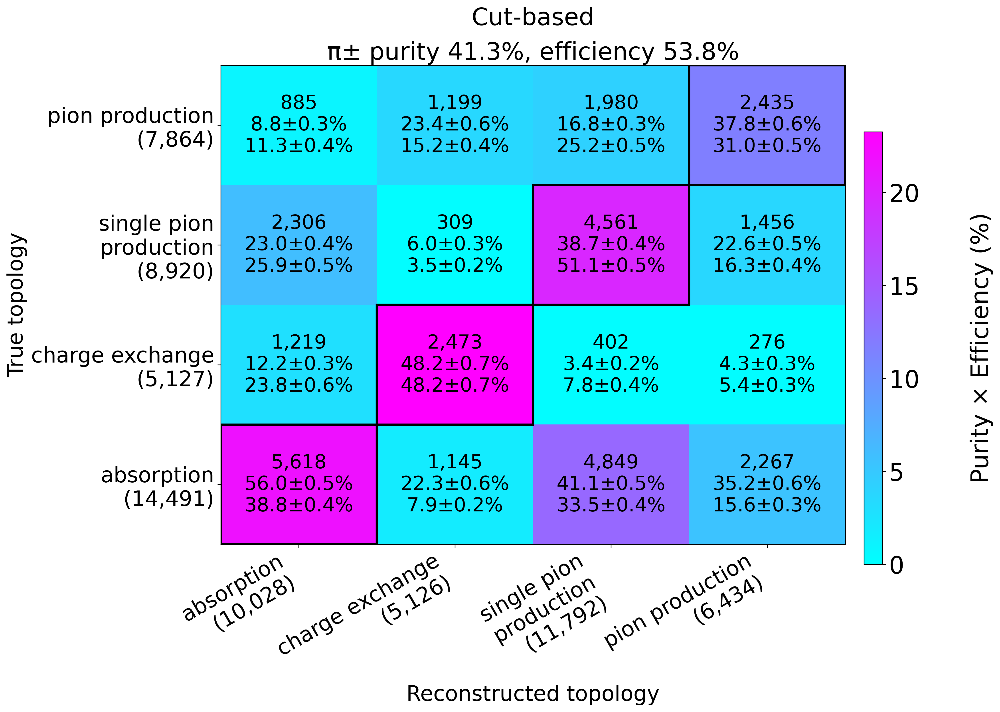

Saved /home/pemb7173/PDSP-pion-classification/plots/topology-selection/topology_pxe_cut.pdf


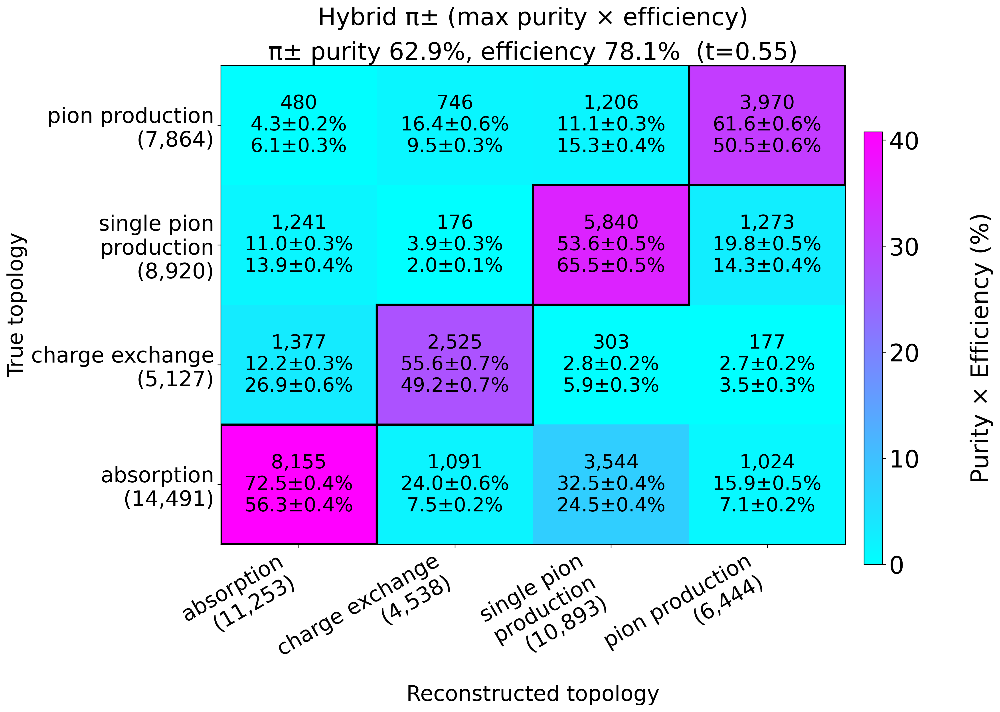

Saved /home/pemb7173/PDSP-pion-classification/plots/topology-selection/topology_pxe_nn_opt.pdf


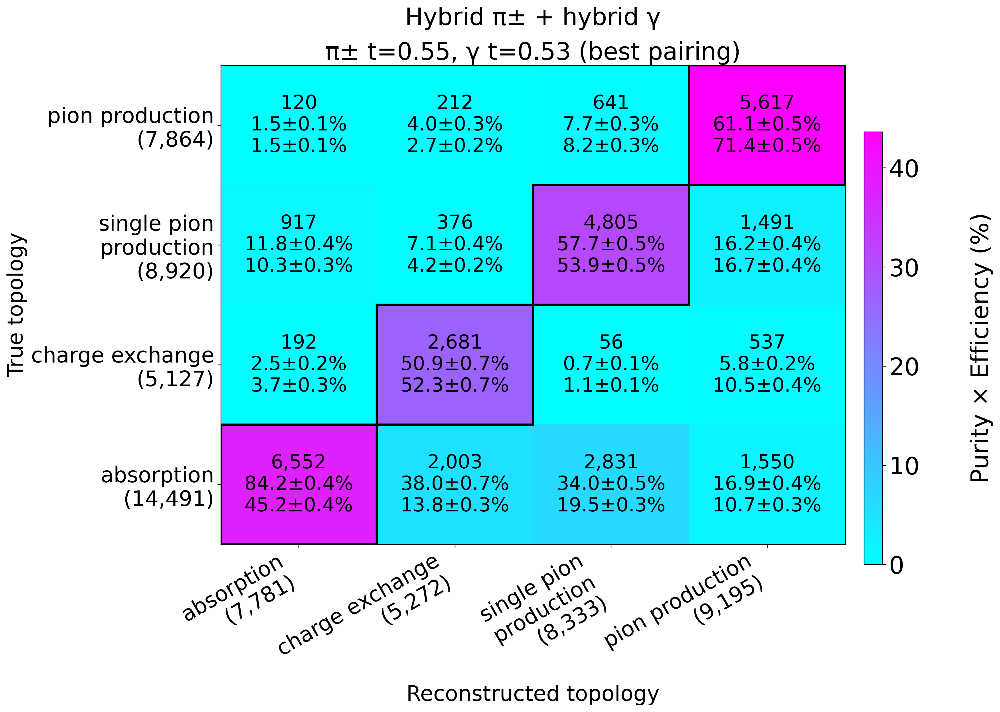

Saved /home/pemb7173/PDSP-pion-classification/plots/topology-selection/topology_pxe_nn_both.pdf


In [15]:
# Slide-sized single panels
for key, title in [('cut',     'Cut-based'),
                   ('nn_opt',  'Hybrid π± (max purity × efficiency)'),
                   ('nn_both', 'Hybrid π± + hybrid γ')]:
    plot_topology_single(joints[key], title, subtitles[key],
                         PLOTS_DIR / f"topology_pxe_{key}.pdf", mode='pxe')